# Decision Trees 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pickle
import functions as fn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import accuracy_score, roc_curve, auc, f1_score, precision_score, recall_score, roc_auc_score
from sklearn.preprocessing import StandardScaler, LabelBinarizer
from sklearn.externals.six import StringIO 
from sklearn.tree import export_graphviz
import pydotplus
from sklearn import tree
from IPython.display import Image

## Running the data preparation notebook in order to generate the necessary pickles

In [2]:
% run ./data_prep.ipynb

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11914 entries, 0 to 11913
Data columns (total 16 columns):
Make                 11914 non-null object
Model                11914 non-null object
Year                 11914 non-null int64
Engine Fuel Type     11911 non-null object
Engine HP            11845 non-null float64
Engine Cylinders     11884 non-null float64
Transmission Type    11914 non-null object
Driven_Wheels        11914 non-null object
Number of Doors      11908 non-null float64
Market Category      8172 non-null object
Vehicle Size         11914 non-null object
Vehicle Style        11914 non-null object
highway MPG          11914 non-null int64
city mpg             11914 non-null int64
Popularity           11914 non-null int64
MSRP                 11914 non-null int64
dtypes: float64(3), int64(5), object(8)
memory usage: 1.5+ MB


./data_prep.ipynb:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  {
./data_prep.ipynb:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  {
/Users/jjherranzsarrion/anaconda3/envs/learn-env/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


<class 'pandas.core.frame.DataFrame'>
Int64Index: 7856 entries, 0 to 11912
Data columns (total 16 columns):
Make                 7856 non-null object
Model                7856 non-null object
Year                 7856 non-null int64
Engine Fuel Type     7856 non-null object
Engine HP            7856 non-null float64
Engine Cylinders     7856 non-null float64
Transmission Type    7856 non-null object
Driven_Wheels        7856 non-null object
Number of Doors      7856 non-null float64
Market Category      6219 non-null object
Vehicle Size         7856 non-null object
Vehicle Style        7856 non-null object
highway MPG          7856 non-null int64
city mpg             7856 non-null int64
Popularity           7856 non-null int64
MSRP                 7856 non-null int64
dtypes: float64(3), int64(5), object(8)
memory usage: 1.0+ MB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 6219 entries, 0 to 11912
Data columns (total 16 columns):
Make                 6219 non-null object
Model     

./data_prep.ipynb:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  {
./data_prep.ipynb:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  {
/Users/jjherranzsarrion/anaconda3/envs/learn-env/lib/python3.6/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 5966 entries, 0 to 11912
Data columns (total 23 columns):
Year                 5966 non-null int64
Engine Fuel Type     5966 non-null object
Engine HP            5966 non-null float64
Engine Cylinders     5966 non-null float64
Transmission Type    5966 non-null object
Driven_Wheels        5966 non-null object
Vehicle Size         5966 non-null object
Vehicle Style        5966 non-null object
highway MPG          5966 non-null int64
city mpg             5966 non-null int64
Popularity           5966 non-null int64
MSRP                 5966 non-null int64
Origin               5966 non-null object
Hatchback            5966 non-null int64
Performance          5966 non-null int64
Diesel               5966 non-null int64
Hybrid               5966 non-null int64
High-Performance     5966 non-null int64
Crossover            5966 non-null int64
Luxury               5966 non-null int64
Flex Fuel            5966 non-null int64
Exotic               

In [3]:
with open('X_train.pickle', 'rb') as f:
    X_train = pickle.load(f)

with open('X_test.pickle', 'rb') as f:
    X_test = pickle.load(f)

with open('y_train.pickle', 'rb') as f:
    y_train = pickle.load(f)
    
with open('y_test.pickle', 'rb') as f:
    y_test = pickle.load(f)

### Instantiating our first Decision Tree and retrieving its corresponding confusion matrics

In [4]:
dt, y_preds, criterion = fn.decision_tree(X_train, X_test, y_train, y_test, 'entropy', None)


Confusion Matrix
----------------
Predicted   0    1   2   3    4    5   6   All
True                                          
0          37    0   0   0    0    0   0    37
1           0  478   0   0    0    0   0   478
2           0    0  64   0    0    0   0    64
3           0    0   0  72    0    0   0    72
4           0    0   0   0  460    0   0   460
5           0    0   0   0    0  317   0   317
6           0    0   0   0    0    0  64    64
All        37  478  64  72  460  317  64  1492


#### Calculating the evaluation metrics for our decision tree precision

In [5]:
print(f"Assesing the accuracy of our scores using the {criterion} impurity criterion. \n")
acc = accuracy_score(y_test, y_preds) * 100
print(f"Accuracy: {acc}")
prc = precision_score(y_test, y_preds, average='weighted') * 100
print(f"Precision: {round(prc, 2)}")
rcl = recall_score(y_test, y_preds, average='weighted') * 100
print(f"Recall: {round(rcl, 2)}")

Assesing the accuracy of our scores using the entropy impurity criterion. 

Accuracy: 100.0
Precision: 100.0
Recall: 100.0


#### Retrieving the features importance from our Decision Tree and an image of the tree and all of its own branches

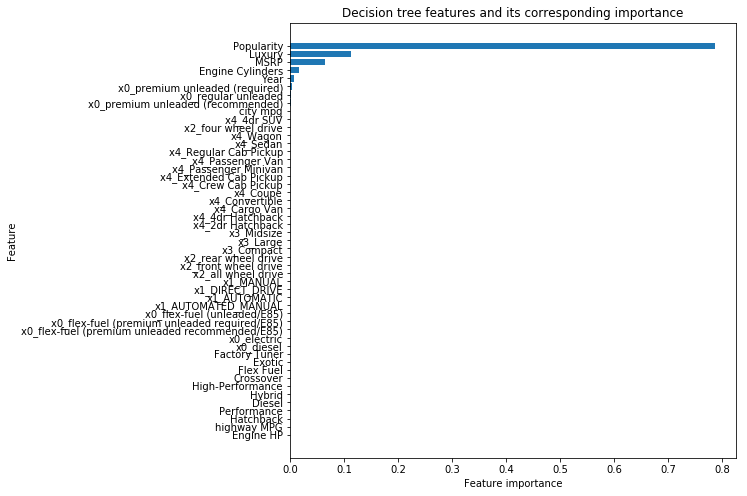

In [6]:
fn.plot_feature_importances(X_train, dt)

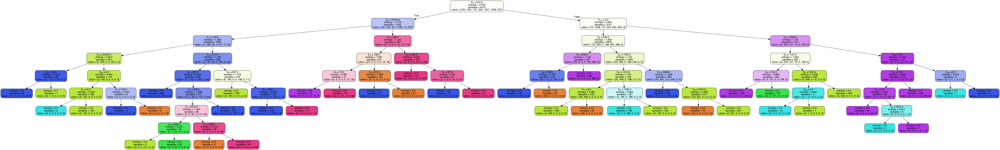

In [7]:
fn.tree_image(dt)

#### Popularity feature is affecting the accuracy of the model through data leakage, therefore we are going to drop it from our feature list

In [8]:
X_train.drop(['Popularity'], axis=1, inplace=True)

In [9]:
X_test.drop(['Popularity'], axis=1, inplace=True)

#### Reruning the notebook without the popularity feature to observe changes in the evaluation metrics

In [10]:
dt, y_preds, criterion = fn.decision_tree(X_train, X_test, y_train, y_test, 'entropy', None)


Confusion Matrix
----------------
Predicted   0    1   2   3    4    5   6   All
True                                          
0          35    0   0   0    0    2   0    37
1           0  470   0   2    4    2   0   478
2           0    0  60   0    4    0   0    64
3           2    7   0  60    3    0   0    72
4           0    3   2   2  446    7   0   460
5           1    1   0   0    7  308   0   317
6           1    0   2   0    0    0  61    64
All        39  481  64  64  464  319  61  1492


In [11]:
print(f"Assesing the accuracy of our scores using the {criterion} impurity criterion. \n")
acc = accuracy_score(y_test, y_preds) * 100
print(f"Accuracy: {acc}")
prc = precision_score(y_test, y_preds, average='weighted') * 100
print(f"Precision: {round(prc, 2)}")
rcl = recall_score(y_test, y_preds, average='weighted') * 100
print(f"Recall: {round(rcl, 2)}")

Assesing the accuracy of our scores using the entropy impurity criterion. 

Accuracy: 96.51474530831099
Precision: 96.51
Recall: 96.51


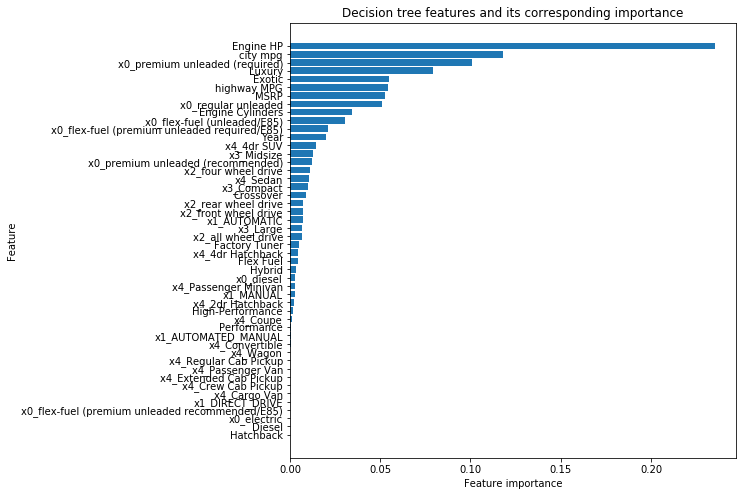

In [12]:
fn.plot_feature_importances(X_train, dt)

In [13]:
fn.tree_image(dt)

Even though data leakage seems to have decreased substantially, the model now has a significant amount of depth, which can be a signal for overfitting. Therefore, we will focus on hypterparameter tuning to reduce this possibility. 

### Hyper parameter tunning

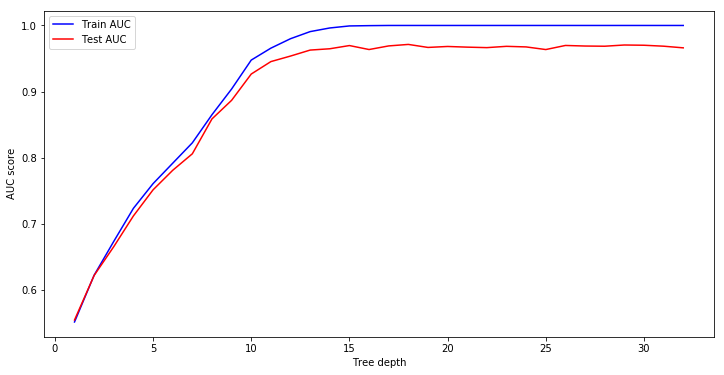

In [14]:
# Identifying the optimal tree depth for the given data
max_depths = np.linspace(1, 32, 32, endpoint=True)
train_results = []
test_results = []
for max_depth in max_depths:
    dt = DecisionTreeClassifier(criterion='entropy', max_depth=max_depth)
    dt.fit(X_train, y_train)
    train_pred = dt.predict(X_train)
    roc_auc_score_train_output = fn.multiclass_roc_auc_score(y_train, train_pred, average="macro")
    # Add auc score to previous train results
    train_results.append(roc_auc_score_train_output)
    y_preds = dt.predict(X_test)
    roc_auc_score_test_output = fn.multiclass_roc_auc_score(y_test, y_preds, average="macro")
    # Add auc score to previous test results
    test_results.append(roc_auc_score_test_output)
plt.figure(figsize=(12,6))
plt.plot(max_depths, train_results, 'b', label='Train AUC')
plt.plot(max_depths, test_results, 'r', label='Test AUC')
plt.ylabel('AUC score')
plt.xlabel('Tree depth')
plt.legend()
plt.show()

In [15]:
# Identify the optimal min-samples-split for given data
#min_samples_splits = np.linspace(0.1, 1.0, 10, endpoint=True)
#train_results = []
#test_results = []
#for min_samples_split in min_samples_splits:
#    dt = DecisionTreeClassifier(criterion='entropy', min_samples_split=min_samples_split)
#    dt.fit(X_train, y_train)
#    train_pred = dt.predict(X_train)
#    roc_auc_score_train_output = multiclass_roc_auc_score(y_train, train_pred, average="macro")
#    train_results.append(roc_auc_score_train_output)
#    y_pred = dt.predict(X_test)
#    roc_auc_score_test_output = multiclass_roc_auc_score(y_test, y_preds, average="macro")
#    test_results.append(roc_auc_score_test_output)
#plt.figure(figsize=(12,6))
#plt.plot(min_samples_splits, train_results, 'b', label='Train AUC')
#plt.plot(min_samples_splits, test_results, 'r', label='Test AUC')
#plt.xlabel('Min. Sample splits')
#plt.legend()
#plt.show()

In [16]:
# Calculate the optimal value for minimum sample leafs
#min_samples_leafs = np.linspace(0.1, 0.5, 5, endpoint=True)
#train_results = []
#test_results = []
#for min_samples_leaf in min_samples_leafs:
#    dt = DecisionTreeClassifier(criterion='entropy', min_samples_leaf=min_samples_leaf)
#    dt.fit(X_train, y_train)
#    train_pred = dt.predict(X_train)
#    roc_auc_score_train_output = multiclass_roc_auc_score(y_train, train_pred, average="macro")
#    train_results.append(roc_auc_score_train_output)
#    y_pred = dt.predict(X_test)
#    roc_auc_score_test_output = multiclass_roc_auc_score(y_test, y_preds, average="macro")
#    test_results.append(roc_auc_score_test_output)

#plt.figure(figsize=(12,6))    
#plt.plot(min_samples_leafs, train_results, 'b', label='Train AUC')
#plt.plot(min_samples_leafs, test_results, 'r', label='Test AUC')
#plt.ylabel('AUC score')
#plt.xlabel('Min. Sample Leafs')
#plt.legend()
#plt.show()

#### Update the decision tree function to include the max_depth parameter

In [17]:
fn.decision_tree(X_train, X_test, y_train, y_test, 'entropy', 15)


Confusion Matrix
----------------
Predicted   0    1   2   3    4    5   6   All
True                                          
0          34    0   0   0    1    2   0    37
1           0  470   0   2    4    2   0   478
2           0    0  61   0    3    0   0    64
3           2    4   0  63    3    0   0    72
4           2    5   2   2  441    8   0   460
5           1    0   0   0    7  308   1   317
6           0    0   2   0    0    0  62    64
All        39  479  65  67  459  320  63  1492


(DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=15,
             max_features=None, max_leaf_nodes=None,
             min_impurity_decrease=0.0, min_impurity_split=None,
             min_samples_leaf=1, min_samples_split=2,
             min_weight_fraction_leaf=0.0, presort=False, random_state=10,
             splitter='best'), array([5, 1, 4, ..., 1, 1, 1]), 'entropy')

In [18]:
print(f"Assesing the accuracy of our scores using the {criterion} impurity criterion. \n")
acc = accuracy_score(y_test, y_preds) * 100
print(f"Accuracy: {acc}")
prc = precision_score(y_test, y_preds, average='weighted') * 100
print(f"Precision: {round(prc, 2)}")
rcl = recall_score(y_test, y_preds, average='weighted') * 100
print(f"Recall: {round(rcl, 2)}")

Assesing the accuracy of our scores using the entropy impurity criterion. 

Accuracy: 96.38069705093834
Precision: 96.38
Recall: 96.38


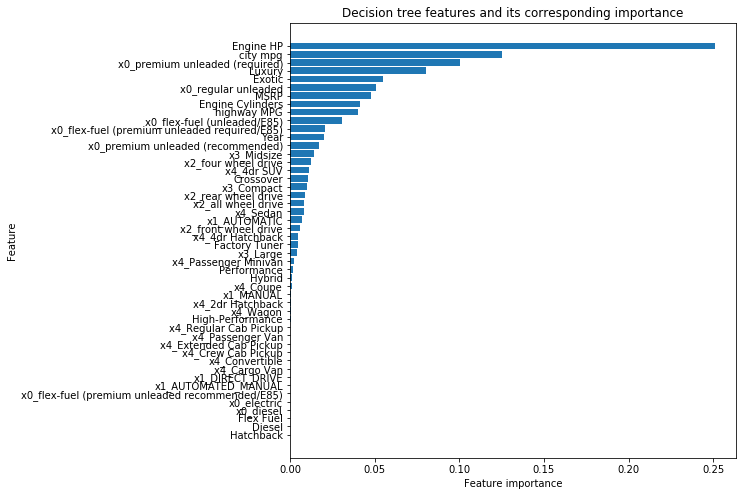

In [19]:
fn.plot_feature_importances(X_train, dt)

In [20]:
fn.tree_image(dt)

Given that the optimal depth is 15 branches, the tree is the same as before the hyper parameter tunning.

In [21]:
fn.get_metrics_by_class(y_test, y_preds, score_type='macro')

,Accuracy,F1_Score,Precision,Recall
0,0.945946,0.921053,0.897436,0.945946
1,0.987448,0.978238,0.969199,0.987448
2,0.906250,0.928000,0.950820,0.906250
3,0.833333,0.888889,0.952381,0.833333
4,0.967391,0.964247,0.961123,0.967391
5,0.965300,0.966825,0.968354,0.965300
6,0.968750,0.976378,0.984127,0.968750
M,0.963807,0.946233,0.954777,0.939203


### Running the model with the gini coefficient instead

In [22]:
dt, y_preds, criterion = fn.decision_tree(X_train, X_test, y_train, y_test, 'gini', 15)


Confusion Matrix
----------------
Predicted   0    1   2   3    4    5   6   All
True                                          
0          37    0   0   0    0    0   0    37
1           0  461   0   1    7    7   2   478
2           0    2  60   0    0    2   0    64
3           0    6   0  64    2    0   0    72
4           0    6   2   2  441    7   2   460
5           3    2   0   0    8  302   2   317
6           2    0   0   0    0    0  62    64
All        42  477  62  67  458  318  68  1492


In [23]:
print(f"Assesing the accuracy of our scores using the {criterion} impurity criterion. \n")
acc = accuracy_score(y_test, y_preds) * 100
print(f"Accuracy: {acc}")
prc = precision_score(y_test, y_preds, average='weighted') * 100
print(f"Precision: {round(prc, 2)}")
rcl = recall_score(y_test, y_preds, average='weighted') * 100
print(f"Recall: {round(rcl, 2)}")

Assesing the accuracy of our scores using the gini impurity criterion. 

Accuracy: 95.64343163538874
Precision: 95.68
Recall: 95.64


Accuracy is not as high as when the model's encoder is entropy.

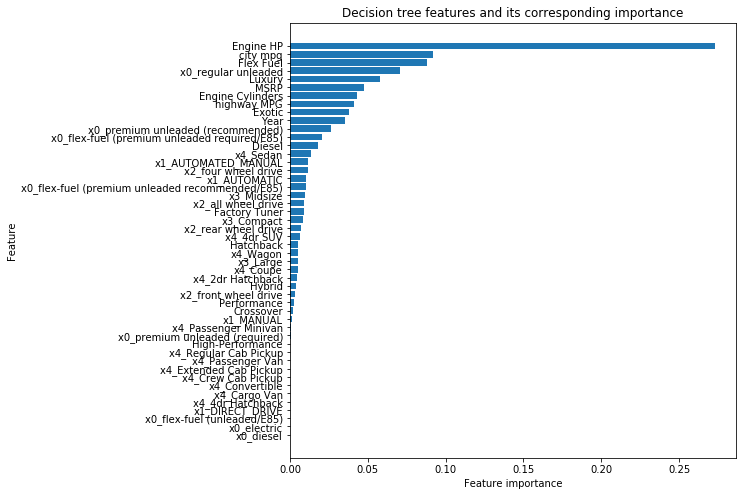

In [24]:
fn.plot_feature_importances(X_train, dt)

It is interesting to see that the Engine HP feature's importance is a bit higher in the gini trees.

## The tree with the highest accuracy is the one that uses the entropy encoder and has a maximum depth of 15